In [1]:
%matplotlib notebook

In [2]:
from multidynet.datasets import load_icews

Y, countries, layer_labels, time_labels = load_icews(dataset='large', country_names='full')

countries_old = countries.copy()

In [ ]:
import joblib

# load the fitted models
models = []
for k in range(1, 7):
    models.append(joblib.load(open(f'icews_model_p{k}.pkl', 'rb')))

## Dimension Selection (Figure 15)

<IPython.core.display.Javascript object>


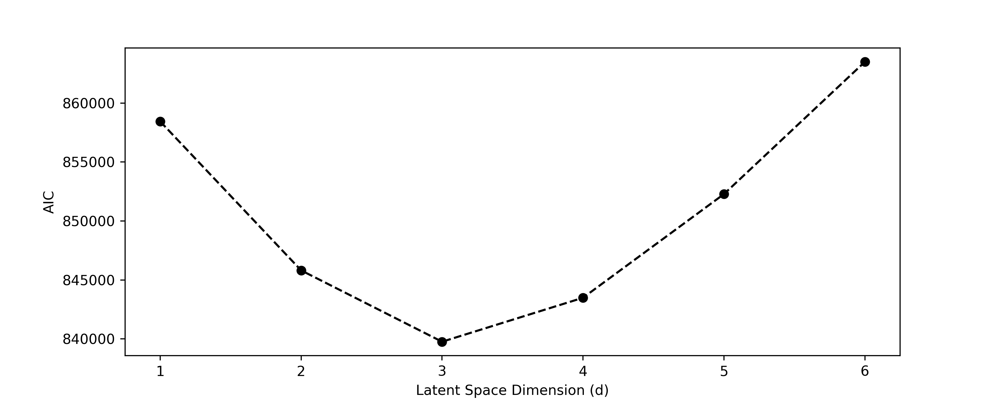

Text(0, 0.5, 'AIC')

In [5]:
aics = [m.aic_ for m in models]
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(np.arange(1, 7), aics, 'ko--')
ax.set_xlabel('Latent Space Dimension (d)')
ax.set_ylabel('AIC')

In [6]:
model = models[2]
model.auc_

0.9065606191663694

## Social Trajectories

### Figure 6

/Users/joshua/.pyenv/versions/stats/lib/python3.10/site-packages/statsmodels-0.13.1-py3.10-macosx-12.1-arm64.egg/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


<IPython.core.display.Javascript object>


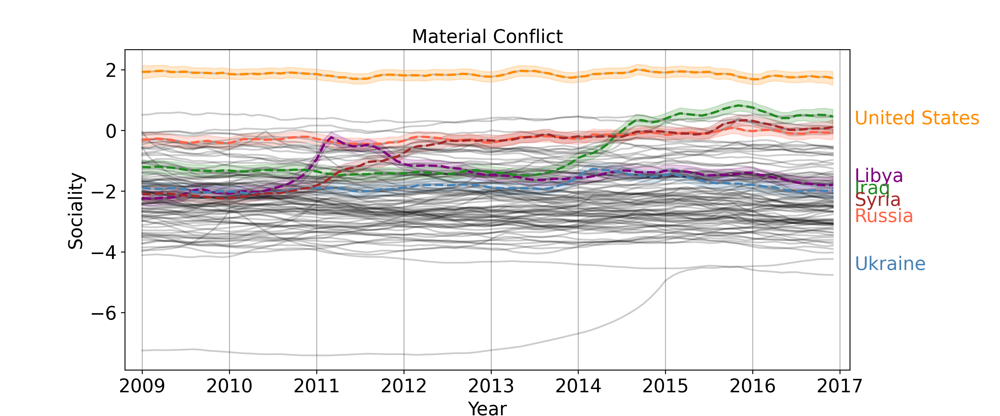

In [7]:
from multidynet.plots import plot_social_trajectories
from scipy.special import logit

k = 3

fig, ax = plot_social_trajectories(model, k=k, 
                 node_list=['United States', 'Russia', 'Libya', 'Iraq',
                            'Ukraine', 'Syria'], 
                 node_colors=['darkorange', 'tomato', 'purple', 'forestgreen',
                              'steelblue', 'brown'],
                 node_labels=countries, layer_label=layer_labels[k], xlabel='Year',
                 line_width=2, label_offset=2, alpha=0.2, fontsize=16,
                 plot_hline=False,
                 figsize=(12, 5))

ax.set_xticks([i * 12 for i in range(9)])
ax.set_xticklabels([2009 + i for i in range(9)], fontsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.margins(x=0.025)
ax.grid(axis='x')
fig.subplots_adjust(right=0.85)

## Figure 16

<IPython.core.display.Javascript object>


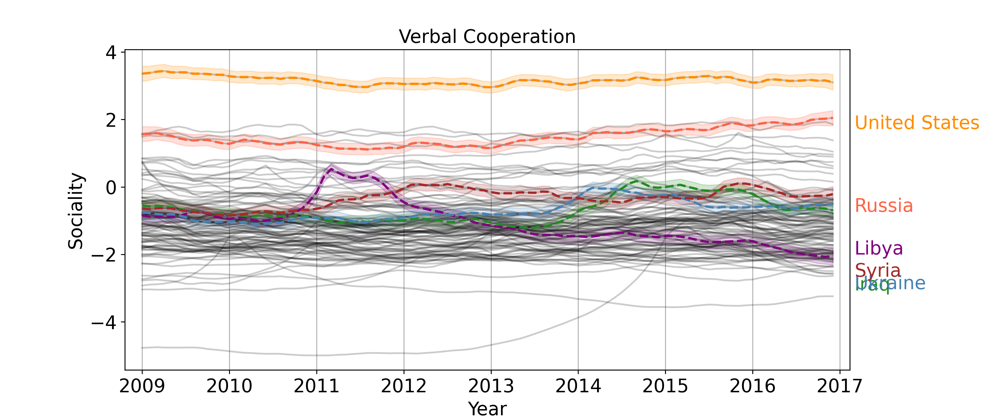

In [58]:
from multidynet.plots import plot_social_trajectories
from scipy.special import logit

k = 0

fig, ax = plot_social_trajectories(model, k=k, 
                 node_list=['United States', 'Russia', 'Libya', 'Iraq',
                            'Ukraine', 'Syria'], 
                 node_colors=['darkorange', 'tomato', 'purple', 'forestgreen',
                              'steelblue', 'brown'],
                 node_labels=countries, layer_label=layer_labels[k], xlabel='Year',
                 line_width=2, label_offset=2, alpha=0.2, fontsize=16,
                 plot_hline=False,
                 figsize=(12, 5))

ax.set_xticks([i * 12 for i in range(9)])
ax.set_xticklabels([2009 + i for i in range(9)], fontsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.margins(x=0.025)
ax.grid(axis='x')
fig.subplots_adjust(right=0.85)

## Figure 17

<IPython.core.display.Javascript object>


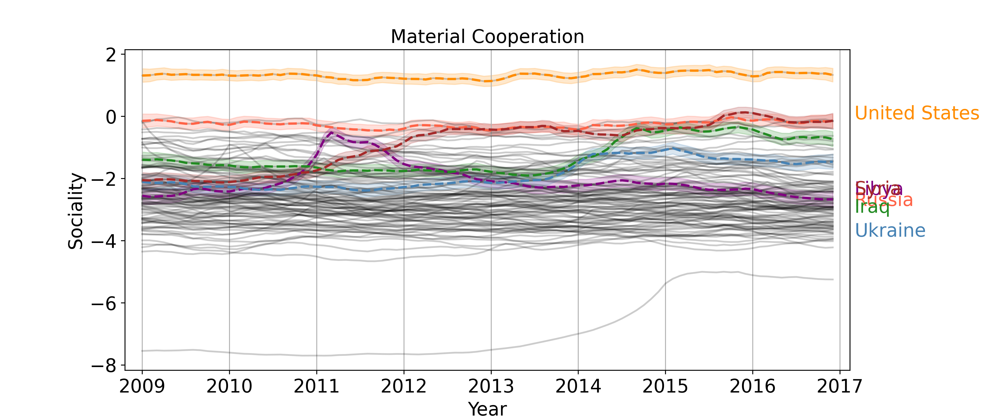

In [55]:
from multidynet.plots import plot_social_trajectories
from scipy.special import logit

k = 1

fig, ax = plot_social_trajectories(model, k=k, 
                 node_list=['United States', 'Russia', 'Libya', 'Iraq',
                            'Ukraine', 'Syria'], 
                 node_colors=['darkorange', 'tomato', 'purple', 'forestgreen',
                              'steelblue', 'brown'],
                 node_labels=countries, layer_label=layer_labels[k], xlabel='Year',
                 line_width=2, label_offset=2, alpha=0.2, fontsize=16,
                 plot_hline=False,
                 figsize=(12, 5))

ax.set_xticks([i * 12 for i in range(9)])
ax.set_xticklabels([2009 + i for i in range(9)], fontsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.margins(x=0.025)
ax.grid(axis='x')
fig.subplots_adjust(right=0.85)

## Figure 18

<IPython.core.display.Javascript object>


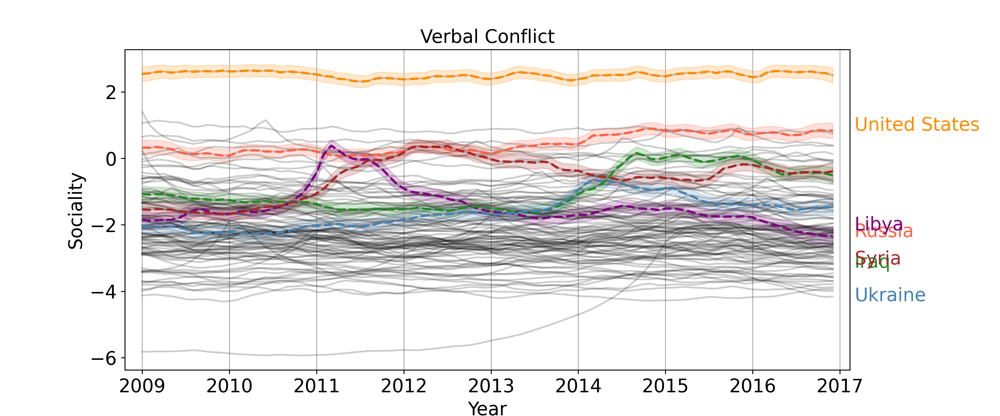

In [59]:
from multidynet.plots import plot_social_trajectories
from scipy.special import logit

k = 2

fig, ax = plot_social_trajectories(model, k=k, 
                 node_list=['United States', 'Russia', 'Libya', 'Iraq',
                            'Ukraine', 'Syria'], 
                 node_colors=['darkorange', 'tomato', 'purple', 'forestgreen',
                              'steelblue', 'brown'],
                 node_labels=countries, layer_label=layer_labels[k], xlabel='Year',
                 line_width=2, label_offset=2, alpha=0.2, fontsize=16,
                 plot_hline=False,
                 figsize=(12, 5))

ax.set_xticks([i * 12 for i in range(9)])
ax.set_xticklabels([2009 + i for i in range(9)], fontsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.margins(x=0.025)
ax.grid(axis='x')
fig.subplots_adjust(right=0.85)

## Variance Credible Intervals

In [8]:
from scipy.stats.distributions import invgamma

x_tau = invgamma.rvs(a=model.a_tau_sq_delta_/2, scale=model.b_tau_sq_delta_/2.,
                 size=20000)
np.quantile(np.sqrt(x_tau), q=[0.025, 0.5, 0.975])

array([3.1990375 , 3.42213464, 3.67192499])

In [9]:
from scipy.stats.distributions import invgamma

x_tau = invgamma.rvs(a=model.c_sigma_sq_delta_/2, scale=model.d_sigma_sq_delta_/2.,
                 size=20000)
np.quantile(np.sqrt(x_tau), q=[0.025, 0.5, 0.975])

array([0.04367695, 0.04398715, 0.04430051])

## Homophily Coefficients (Figure 7)

<IPython.core.display.Javascript object>


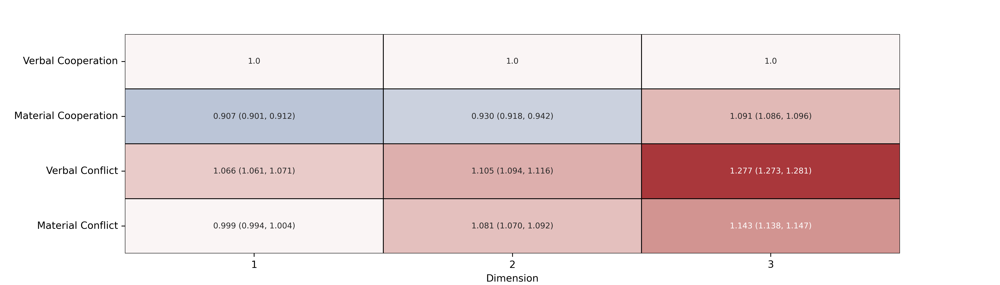

Text(0.5, 14.722222222222216, 'Dimension')

In [19]:
import seaborn as sns
from scipy.stats.distributions import norm

model = models[2]

q_alpha = 0.05
z_alpha = norm.ppf(1 - q_alpha / 2.)

n_layers = model.lambda_.shape[0]
n_features = model.lambda_.shape[1]
labels = []
for k in range(n_layers):
    nums = []
    for p in range(n_features):
        lmbda = model.lambda_[k, p] 
        if k == 0:
            txt = lmbda
        else:
            xerr = z_alpha * np.sqrt(model.lambda_sigma_[:, p, p])
            txt = '{:.3f} ({:.3f}, {:.3f})'.format(
                 lmbda, lmbda - xerr[k], lmbda + xerr[k])
        nums.append(txt)
    labels.append(nums)

fig, ax = plt.subplots(figsize=(14, 4))
g = sns.heatmap(model.lambda_, center=1, fmt='', annot=labels, cmap='vlag', cbar=False,
                annot_kws={"size": 8}, linewidths=0.5, linecolor='black',
            yticklabels=layer_labels, xticklabels = [f'{i+1}' for i in range(3)], ax=ax)

g.set_xlabel('Dimension')

## Latent Space (Figure 8)

<IPython.core.display.Javascript object>


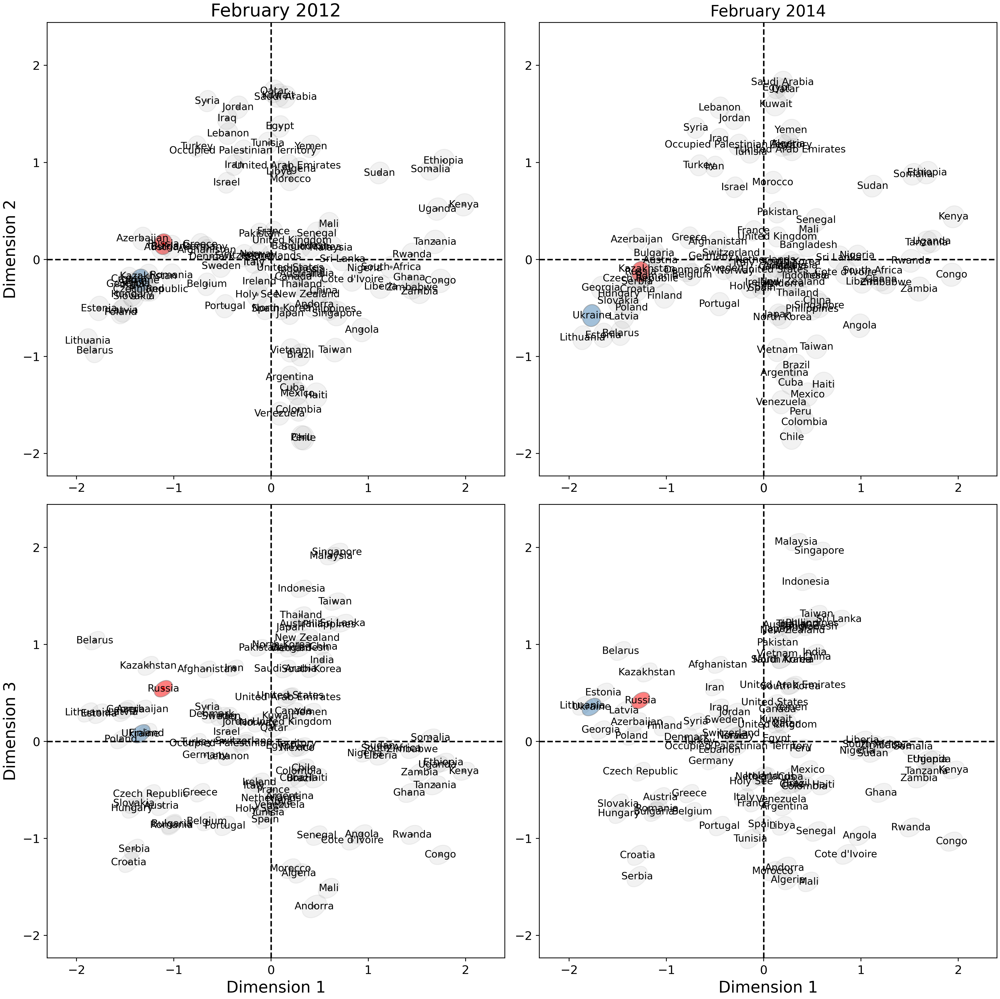

In [23]:
from multidynet.plots import plot_network, normal_contour, plot_latent_space
import joblib

k = 0


fig, ax= plt.subplots(figsize=(14, 14), nrows=2, ncols=2, sharex=False, sharey=True, constrained_layout=True)


countries[np.where(countries_old == 'Democratic Republic of Congo')[0]] = 'Congo'

node_colors = ['gray' for c in countries]
node_colors[int(np.where(countries == 'Ukraine')[0])] = 'steelblue'
node_colors[int(np.where(countries == 'Russia')[0])] = 'red'
node_colors = np.asarray(node_colors)

ax[0, 0].autoscale(enable=True)

calpha = np.asarray([0.5 if n == 'Ukraine' or n == 'Russia' else 0.1 for n in countries])

dimensions = np.array([[0, 1], [0, 2]])

for i in range(dimensions.shape[0]):
    dims = dimensions[i]
    
    t = 37
    plot_latent_space(Y[k, t], model.Z_[t], X_sigma=model.Z_sigma_[t], 
                  dims=dims,
                       with_labels=True, font_size=10,
                       node_labels=countries,
                       contour_alpha=calpha,
                       node_color=node_colors,
                       size=10, edge_width=0,
                       ax=ax[i, 0])
    if i == 0:
        ax[i, 0].set_title('{}'.format(time_labels[t]), fontsize=18)
    ax[i, 0].axhline(0, linestyle='--', color='k')
    ax[i, 0].axvline(0, linestyle='--', color='k')
    ax[i, 0].tick_params(axis='both', which='major', labelsize=12)
    ax[i, 0].set_ylabel(f'Dimension {dims[1] + 1}', fontsize=16)
    
    if i == 1:
        ax[i, 0].set_xlabel(f'Dimension {dims[0] + 1}', fontsize=16)

    t = 61
    plot_latent_space(Y[k, t], model.Z_[t], X_sigma=model.Z_sigma_[t], 
                  dims=dims,
                       with_labels=True, font_size=10,
                       node_labels=countries,
                       contour_alpha=calpha,
                       node_color=node_colors,
                       size=0, edge_width=0,
                       ax=ax[i, 1])
    if i == 0:
        ax[i, 1].set_title('{}'.format(time_labels[t]), fontsize=16)
    ax[i, 1].axhline(0, linestyle='--', color='k')
    ax[i, 1].axvline(0, linestyle='--', color='k')
    ax[i, 1].tick_params(axis='both', which='major', labelsize=12)
    #ax[1].set_ylabel(f'Dimension {dims[1] + 1}', fontsize=12)
    
    if i == 1:
        ax[i, 1].set_xlabel(f'Dimension {dims[0] + 1}', fontsize=16)

## Latent Trajectories (Figure 9)

In [21]:
def unit_vector(vector):
    """ Returns the unit vector of the vector.  """
    return vector / np.linalg.norm(vector)

def angle_between(v1, v2):
    """ Returns the angle in radians between vectors 'v1' and 'v2'::

            >>> angle_between((1, 0, 0), (0, 1, 0))
            1.5707963267948966
            >>> angle_between((1, 0, 0), (1, 0, 0))
            0.0
            >>> angle_between((1, 0, 0), (-1, 0, 0))
            3.141592653589793
    """
    v1_u = unit_vector(v1)
    v2_u = unit_vector(v2)
    return np.arccos(np.clip(np.dot(v1_u, v2_u), -1.0, 1.0)) * (180/np.pi)

# sample from the approximate posterior
samples = model.sample(size=5000)

l = np.sqrt(samples['lambda'])[:, -1, :]
X = samples['X'][..., [60, 8], :]

theta = np.zeros((X.shape[0], X.shape[1]))
mag = np.zeros((X.shape[0], X.shape[1], 2))
for idx in range(X.shape[0]):
    for t in range(X.shape[1]):
        x1 = X[idx, t, 0]
        x2 = X[idx, t, 1]
        theta[idx, t] = angle_between(x1, x2)
        mag[idx, t, 0] = np.sqrt((x1 * x1).sum())
        mag[idx, t, 1] = np.sqrt((x2 * x2).sum())

<IPython.core.display.Javascript object>


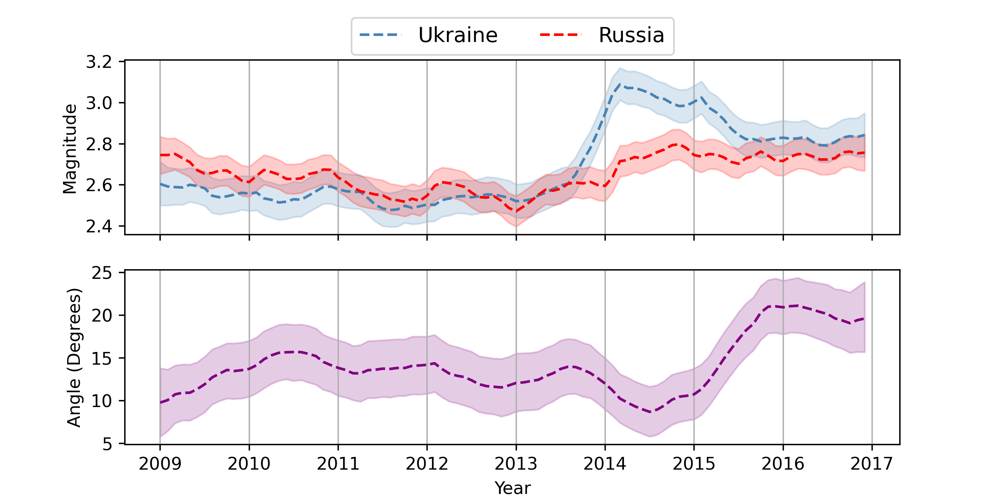

Text(0, 0.5, 'Angle (Degrees)')

In [22]:
fig, ax = plt.subplots(nrows=2, figsize=(8, 4), sharex=True)

ts = np.arange(X.shape[1])

intervals = np.quantile(mag, q=[0.025, 0.975], axis=0)
ax[0].plot(np.median(mag, axis=0)[:, 0], linestyle='--', color='steelblue', label='Ukraine')
ax[0].fill_between(ts, intervals[0, :, 0], intervals[1, :, 0], alpha=0.2, color='steelblue')

ax[0].plot(np.median(mag, axis=0)[:, 1], linestyle='--', color='red', label='Russia')
ax[0].fill_between(ts, intervals[0, :, 1], intervals[1, :, 1], alpha=0.2, color='red')
ax[0].grid(axis='x')
ax[0].set_ylabel(r"Magnitude")

ax[0].legend(ncol=2, bbox_to_anchor=(0.5, 1.3), loc='upper center', fontsize=12)

intervals = np.quantile(theta, q=[0.025, 0.975], axis=0)
ax[1].plot(np.median(theta, axis=0), linestyle='--', color='purple')
ax[1].fill_between(ts, intervals[0], intervals[1], alpha=0.2, color='purple')
ax[1].set_xticks([i * 12 for i in range(9)])
ax[1].set_xticklabels([2009 + i for i in range(9)])
ax[1].grid(axis='x')
ax[1].set_xlabel('Year')
ax[1].set_ylabel(r'Angle (Degrees)')

## Dyad-wise Probabilities (Figure 10)

<IPython.core.display.Javascript object>


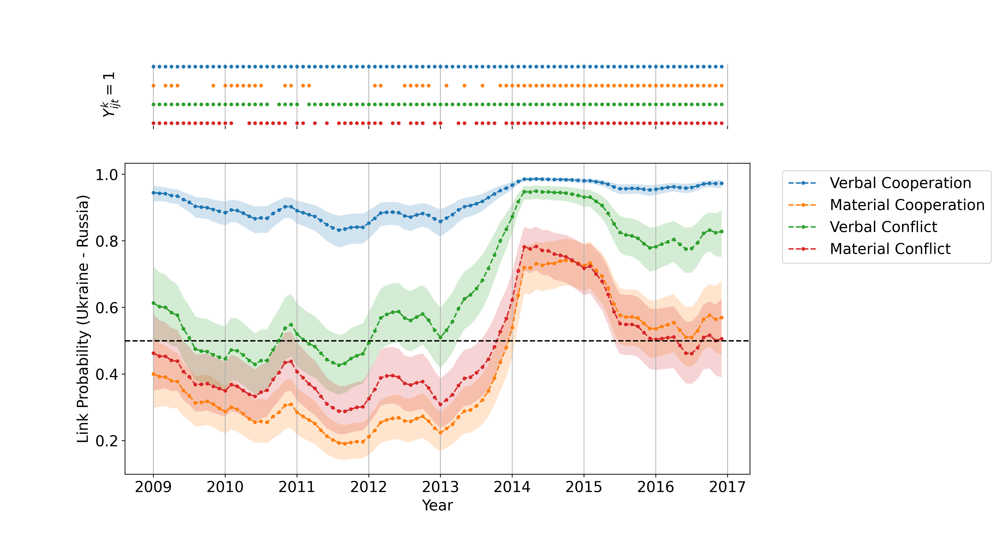

In [25]:
from multidynet.plots import plot_pairwise_probabilities

horizon=0


fig, axes = plt.subplots(figsize=(15,8), nrows=2, sharex=True,
                         gridspec_kw={'height_ratios': [1, 5]})
_, ax = plot_pairwise_probabilities(model, 'Ukraine', 'Russia', 
                                      node_labels=countries, horizon=horizon,
                                      linestyle='.--', figsize=(10, 6),
                                      layer_labels=layer_labels,
                                      n_reps=5000,
                                      ax=axes[1])
axes[1].axhline(0.5, linestyle='--', color='k')

for k in range(Y.shape[0]):
    mask = Y[k, :, 60, 8] == 1
    axes[0].plot(np.arange(Y.shape[1])[mask], Y[k, :, 60, 8][mask] - k, '.')
    axes[0].set_yticks([])

ax.set_xticks([i * 12 for i in range(9)])
ax.set_xticklabels([2009 + i for i in range(9)], fontsize=16)
ax.grid(axis='x')
ax.set_xlabel('Year', fontsize=16)

axes[0].grid(axis='x')
[a.set_visible(False) for a in axes[0].spines.values()]


axes[0].set_ylabel('$Y_{ijt}^k = 1$', fontsize=16)
ax.tick_params(axis='y', labelsize=16)
axes[0].set_xlabel('')

if horizon > 0:
    ax.axvline(8 * 12, 0, 1, color='k', linestyle='dotted', lw=2)

fig.subplots_adjust(right=0.75)